## Llama Space of Words Exploration Part 1 - For Book

In [1]:
from datasets import load_dataset
import re

dataset = load_dataset("wikipedia", "20220301.en")

Loading dataset shards:   0%|          | 0/41 [00:00<?, ?it/s]

In [2]:
max_examples=2500

In [3]:
from datasets import load_dataset
import re

# Load the dataset
dataset = load_dataset("wikipedia", "20220301.en")

def extract_context_windows(text, target_word, window_size=100, max_examples=250):
    """Extract 100-token windows ending with the target city name"""
    contexts = []
    
    # Tokenization that keeps punctuation as separate tokens
    # This pattern matches either word characters OR individual non-whitespace characters
    tokens = re.findall(r'\w+|[^\w\s]', text)
    
    for i, token in enumerate(tokens):
        if token.lower() == target_word.lower():
            # Get the 100 tokens leading up to this city name (or fewer if not available)
            start_idx = max(0, i - window_size + 1)
            context_window = tokens[start_idx:i+1]  # Include the city name as final token
            
            # Join back into text with appropriate spacing
            context_text = ''
            for j, tok in enumerate(context_window):
                if j == 0:
                    context_text = tok
                # Don't add space before punctuation (except opening quotes/brackets)
                elif tok in '.,;:!?)]\'"›»':
                    context_text += tok
                # Don't add space after opening quotes/brackets
                elif j > 0 and context_window[j-1] in '([\'""‹«':
                    context_text += tok
                else:
                    context_text += ' ' + tok
            
            contexts.append(context_text)
            
            if len(contexts) >= max_examples:
                break
                
    return contexts

# Collect context windows for each city
cities = ['Paris', 'Madrid', 'Berlin']
city_contexts = {city: [] for city in cities}

# Search through the dataset
for example in dataset['train']:
    text = example['text']
    
    for city in cities:
        if len(city_contexts[city]) < max_examples:
            found_contexts = extract_context_windows(
                text, city, 100, max_examples - len(city_contexts[city])
            )
            city_contexts[city].extend(found_contexts)
    
    # Stop when we have enough for all cities
    if all(len(contexts) >= max_examples for contexts in city_contexts.values()):
        break

# Check results
for city, contexts in city_contexts.items():
    print(f"{city}: {len(contexts)} context windows found")
    if contexts:
        print(f"Example ending: ...{contexts[0][-50:]}")  # Show last 50 chars
        # Count tokens using the same tokenization method
        example_tokens = re.findall(r'\w+|[^\w\s]', contexts[0])
        print(f"Token count: {len(example_tokens)}")
    print()

Loading dataset shards:   0%|          | 0/41 [00:00<?, ?it/s]

Paris: 2500 context windows found
Example ending: ... in several revolutions, most notably in the Paris
Token count: 100

Madrid: 2500 context windows found
Example ending: ...ony van Dyck (before 1618; Museo del Prado, Madrid
Token count: 100

Berlin: 2500 context windows found
Example ending: ...elis Opera edidit Academia Regia Borussica, Berlin
Token count: 100



In [4]:
# from datasets import load_dataset
# import re

# # Load the dataset
# dataset = load_dataset("wikipedia", "20220301.en")

# def extract_context_windows(text, target_word, window_size=100, max_examples=250):
#     """Extract 100-token windows ending with the target city name"""
#     contexts = []
    
#     # Simple tokenization (split on whitespace and punctuation)
#     tokens = re.findall(r'\b\w+\b', text)
    
#     for i, token in enumerate(tokens):
#         if token.lower() == target_word.lower():
#             # Get the 100 tokens leading up to this city name (or fewer if not available)
#             start_idx = max(0, i - window_size + 1)
#             context_window = tokens[start_idx:i+1]  # Include the city name as final token
            
#             # Join back into text
#             context_text = ' '.join(context_window)
#             contexts.append(context_text)
            
#             if len(contexts) >= max_examples:
#                 break
                
#     return contexts

# # Collect context windows for each city
# cities = ['Paris', 'Madrid', 'Berlin']
# city_contexts = {city: [] for city in cities}

# # Search through the dataset
# for example in dataset['train']:
#     text = example['text']
    
#     for city in cities:
#         if len(city_contexts[city]) < 250:
#             found_contexts = extract_context_windows(
#                 text, city, 100, 250 - len(city_contexts[city])
#             )
#             city_contexts[city].extend(found_contexts)
    
#     # Stop when we have enough for all cities
#     if all(len(contexts) >= 250 for contexts in city_contexts.values()):
#         break

# # Check results
# for city, contexts in city_contexts.items():
#     print(f"{city}: {len(contexts)} context windows found")
#     print(f"Example ending: ...{contexts[0][-50:]}")  # Show last 50 chars
#     print(f"Token count: {len(contexts[0].split())}")
#     print()

In [5]:
city_contexts['Berlin'][0]

"based on Aristotle's four causes, are used to analyse animal behaviour; they examine function, phylogeny, mechanism, and ontogeny. Surviving works Corpus Aristotelicum The works of Aristotle that have survived from antiquity through medieval manuscript transmission are collected in the Corpus Aristotelicum. These texts, as opposed to Aristotle's lost works, are technical philosophical treatises from within Aristotle's school. Reference to them is made according to the organization of Immanuel Bekker's Royal Prussian Academy edition (Aristotelis Opera edidit Academia Regia Borussica, Berlin"

In [6]:
city_contexts['Madrid'][10]

') 2006 – In Tam, Cambodian general and politician, 26th Prime Minister of Cambodia (b. 1916) 2010 – John Forsythe, American actor (b. 1918) 2010 – Tzannis Tzannetakis, Greek soldier and politician, 175th Prime Minister of Greece (b. 1927) 2012 – Lionel Bowen, Australian soldier, lawyer, and politician, Deputy Prime Minister of Australia (b. 1922) 2012 – Giorgio Chinaglia, Italian - American soccer player and radio host (b. 1947) 2012 – Miguel de la Madrid'

In [7]:
city_contexts['Paris'][100]

'of Alfred Nobel. In 2001, Alfred Nobel\'s great - great - nephew, Peter Nobel (born 1931), asked the Bank of Sweden to differentiate its award to economists given"in Alfred Nobel\'s memory"from the five other awards. This request added to the controversy over whether the Bank of Sweden Prize in Economic Sciences in Memory of Alfred Nobel is actually a legitimate"Nobel Prize". Death Nobel was accused of high treason against France for selling Ballistite to Italy, so he moved from Paris'

In [8]:
len(city_contexts['Paris'])

2500

In [9]:
# for c in city_contexts['Paris']:
#     if 'Treaty of' in c:
#         print(c)
#         print('\n')

In [10]:
# for c in city_contexts['Madrid'][:200]:
#     print(c)
#     print('\n')

In [11]:
import torch
from transformers import pipeline
from torch.nn import functional as F
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import os

from transformers import LlamaForCausalLM, PreTrainedTokenizerFast, LlamaConfig
from transformers import AutoModelForCausalLM, AutoTokenizer
device='cuda'

model_id = "meta-llama/Llama-3.2-1B"

# model = AutoModelForCausalLM.from_pretrained(model_id).to(device)
model = AutoModelForCausalLM.from_pretrained(model_id, torch_dtype=torch.float16).to(device) #Seems like this work? Saves a lot of memory!
tokenizer = AutoTokenizer.from_pretrained(model_id)

In [12]:
tokens = city_contexts['Berlin'][150].split()
context_without_city = ' '.join(tokens[:-1])
input_ids=tokenizer.encode(context_without_city, return_tensors="pt").to(device)

In [13]:
with torch.no_grad():
    outputs = model(input_ids, labels=input_ids)

my_probs=F.softmax(outputs.logits, dim=-1)
sI=np.argsort(my_probs[0,-1, :].detach().cpu().float().numpy())[::-1]
for i in sI[:10]:
    print(i, round(my_probs[0, -1, i].item(),5), tokenizer.decode([i]))

20437 0.57617  Berlin
10057 0.31812  Germany
7295 0.02341  London
403 0.02066 port
13286 0.00407  Virginia
15163 0.00382 chester
220 0.00319  
73220 0.00255  Hartford
1083 0.00251 min
17681 0.00245  Hollywood


Ok dope, qualitatively this feels pretty accurate. 

In [14]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import umap
from tqdm import tqdm

def extract_residual_activations(city_contexts, model, tokenizer, device, layer_id=8):
    """Extract residual stream activations at specified layer for final token"""
    
    all_activations = []
    all_labels = []
    all_cities = []
    
    # Hook to capture activations
    activations = {}
    
    def get_activation(name):
        def hook(model, input, output):
            activations[name] = output[0].detach()  # [batch_size, seq_len, hidden_dim]
        return hook
    
    # Register hook at the specified layer
    hook_name = f'layer_{layer_id}'
    hook = model.model.layers[layer_id].register_forward_hook(get_activation(hook_name))
    
    try:
        for city, contexts in city_contexts.items():
            print(f"Processing {city} contexts...")
            
            for i, context in enumerate(tqdm(contexts)):  # Process first 100
                # Remove the last token (city name) for input
                tokens = context.split()
                context_without_city = ' '.join(tokens[:-1])
                
                # Tokenize
                inputs = tokenizer(context_without_city, return_tensors='pt').to(device)
                
                with torch.no_grad():
                    # Forward pass (hook will capture activations)
                    _ = model(**inputs)
                    
                    # Get the final token's activation
                    final_token_activation = activations[hook_name][0, -1, :].cpu().numpy()
                    
                    all_activations.append(final_token_activation)
                    all_labels.append(len(all_activations) - 1)  # Unique ID for each example
                    all_cities.append(city)
    
    finally:
        # Remove the hook
        hook.remove()
    
    return np.array(all_activations), all_cities, all_labels



In [15]:
layer_id=7

In [16]:
# Extract activations
print("Extracting residual stream activations...")
activations, cities, labels = extract_residual_activations(
    city_contexts, model, tokenizer, device, layer_id=layer_id
)

Extracting residual stream activations...
Processing Paris contexts...


100%|██████████████████████████████████████| 2500/2500 [00:58<00:00, 42.67it/s]


Processing Madrid contexts...


100%|██████████████████████████████████████| 2500/2500 [00:58<00:00, 42.68it/s]


Processing Berlin contexts...


100%|██████████████████████████████████████| 2500/2500 [00:58<00:00, 42.75it/s]


In [17]:
activations.shape

(7500, 2048)

In [18]:
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    n_components=2,
    metric='cosine',  # Good for high-dimensional embeddings
    random_state=42
)

umap_embedding = reducer.fit_transform(activations)

/home/stephen/anaconda3/envs/backprop/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/stephen/anaconda3/envs/backprop/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [19]:
umap_embedding.shape

(7500, 2)

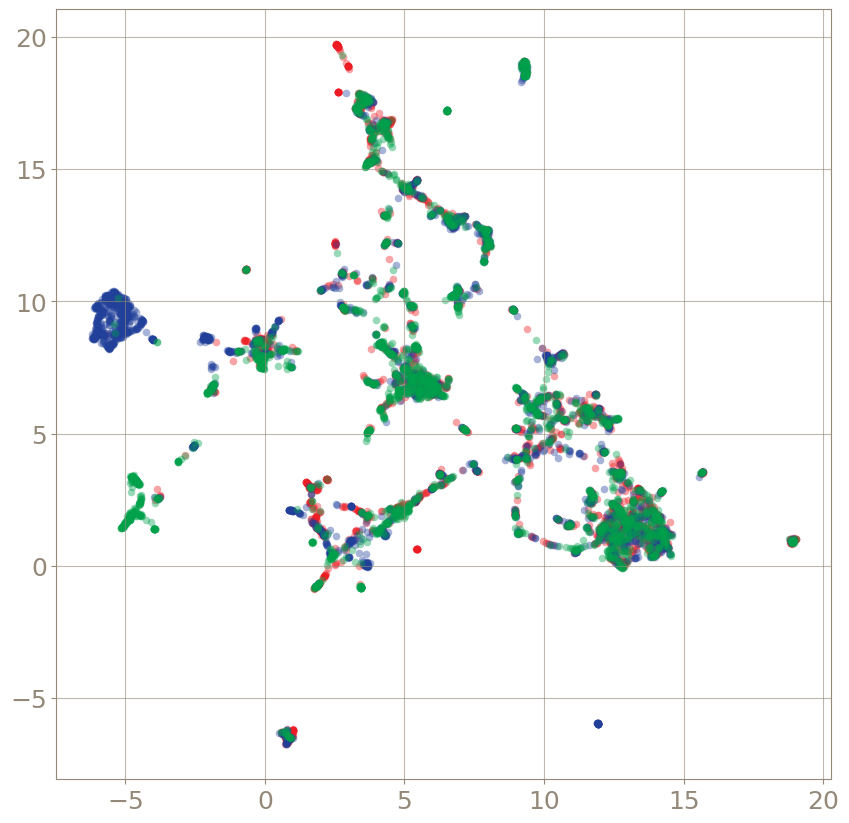

In [20]:
BLUE='#21409a'
RED='#ed1c24'
GREEN='#00a14b'
CHILL_BROWN='#948979'
PURPLE='#7f3f98'

# Create visualization
fig = plt.figure(figsize=(10, 10), facecolor='w')
ax = fig.add_subplot(111, facecolor='w')

# Color map for cities
colors = {'Paris': RED, 'Madrid': BLUE, 'Berlin': GREEN}
city_colors = [colors[city] for city in cities]

# Create scatter plot
for city in ['Paris', 'Madrid', 'Berlin']:
    mask = np.array(cities) == city
    plt.scatter(
        umap_embedding[mask, 0], 
        umap_embedding[mask, 1], 
        c=colors[city], 
        label=city, 
        alpha=0.4,
        linewidths=0,
        edgecolor=None,
        s=30
    )

# Style the axes, ticks, tick labels, and gridlines with CHILL_BROWN
ax.spines['bottom'].set_color(CHILL_BROWN)
ax.spines['top'].set_color(CHILL_BROWN)
ax.spines['left'].set_color(CHILL_BROWN)
ax.spines['right'].set_color(CHILL_BROWN)

ax.tick_params(axis='x', colors=CHILL_BROWN, labelsize=18)
ax.tick_params(axis='y', colors=CHILL_BROWN, labelsize=18)

# Set tick colors
ax.tick_params(axis='x', colors=CHILL_BROWN)
ax.tick_params(axis='y', colors=CHILL_BROWN)

# Set tick label colors
ax.xaxis.label.set_color(CHILL_BROWN)
ax.yaxis.label.set_color(CHILL_BROWN)

# Style the gridlines
plt.grid(True, alpha=0.6, color=CHILL_BROWN)
# plt.xlim([-8, 6])
# plt.ylim([-6,  4])
# plt.savefig('/home/stephen/backprop2/umap-book-2500.svg')
plt.savefig('/home/stephen/backprop2/umap-book-2500.png', dpi=250)

In [21]:
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd
import textwrap

def create_interactive_visualization(umap_embedding, cities, city_contexts, layer_id=8):
    """Create interactive UMAP plot with hover text"""
    
    # Prepare the data
    plot_data = []
    
    context_idx = 0
    for city, contexts in city_contexts.items():
        # for i, context in enumerate(contexts[:100]):  # Match the number we processed
         for i, context in enumerate(contexts):  # All
            # Get the context without the final city name
            tokens = context.split()
            context_without_city = ' '.join(tokens[:-1])
            
            # Wrap text for better display - show last 300 chars, wrapped at 50 chars per line
            display_text = context_without_city[-300:] if len(context_without_city) > 300 else context_without_city
            wrapped_text = '<br>'.join(textwrap.wrap(display_text, width=50))
            
            plot_data.append({
                'x': umap_embedding[context_idx, 0],
                'y': umap_embedding[context_idx, 1],
                'city': city,
                'context': wrapped_text,
                'full_context': context_without_city,  # Keep full context for analysis
                'example_id': context_idx
            })
            
            context_idx += 1
    
    df = pd.DataFrame(plot_data)
    
    # Create the plot using graph_objects for more control over hover
    fig = go.Figure()
    
    colors = {'Paris': 'red', 'Madrid': 'blue', 'Berlin': 'green'}
    
    for city in ['Paris', 'Madrid', 'Berlin']:
        city_data = df[df['city'] == city]
        
        fig.add_trace(go.Scatter(
            x=city_data['x'],
            y=city_data['y'],
            mode='markers',
            name=city,
            marker=dict(color=colors[city], size=6, opacity=0.7),
            hovertemplate="<b>%{fullData.name}</b><br><br>" +
                         "Context:<br>%{customdata}<br><br>" +
                         "Coordinates: (%{x:.2f}, %{y:.2f})" +
                         "<extra></extra>",
            customdata=city_data['context'],
            hoverlabel=dict(
                bgcolor="white",
                bordercolor=colors[city],
                font_size=12,
                font_family="monospace"
            )
        ))
    
    # Update layout (removed the invalid borderwidth property)
    fig.update_layout(
        title=f'Interactive UMAP Visualization - Layer {layer_id}<br><sub>Hover over points to see wrapped context text</sub>',
        xaxis_title='UMAP Dimension 1',
        yaxis_title='UMAP Dimension 2',
        width=1200,
        height=800,
        showlegend=True,
        hovermode='closest',
        hoverlabel=dict(
            bgcolor="rgba(255,255,255,0.9)",
            bordercolor="black",  # Removed borderwidth, kept bordercolor
            font_size=11,
            font_family="Courier New, monospace"
        )
    )
    
    return fig, df

# Create the interactive plot with better text wrapping
print("Creating interactive visualization with wrapped text...")
fig, plot_df = create_interactive_visualization(umap_embedding, cities, city_contexts, layer_id=8)

# Display the plot
fig.show()

# Enhanced function to examine clusters with better text display
def examine_cluster_region(plot_df, x_range, y_range, show_full_context=True):
    """Examine text samples in a specific region of the UMAP space"""
    mask = (
        (plot_df['x'] >= x_range[0]) & (plot_df['x'] <= x_range[1]) &
        (plot_df['y'] >= y_range[0]) & (plot_df['y'] <= y_range[1])
    )
    
    region_samples = plot_df[mask]
    
    print(f"\nFound {len(region_samples)} samples in region x={x_range}, y={y_range}")
    print(f"City distribution: {region_samples['city'].value_counts().to_dict()}")
    
    print("\nSample texts from this region:")
    for idx, row in region_samples.head(3).iterrows():
        print(f"\n--- {row['city']} Example ---")
        if show_full_context:
            # Wrap the full context for readability
            wrapped_full = textwrap.fill(row['full_context'][-400:], width=80)
            print(wrapped_full)
        else:
            print(row['context'].replace('<br>', ' '))
        print("-" * 50)
    
    return region_samples

print("\nFixed the property error - now the hover text should work properly!")
print("Try hovering over different clusters to see the wrapped context text.")

Creating interactive visualization with wrapped text...



Fixed the property error - now the hover text should work properly!
Try hovering over different clusters to see the wrapped context text.
